## スペクトラルサブトラクションによるノイズ除去

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.signal
import librosa
import warnings
warnings.simplefilter('ignore')
import pywt
import IPython.display as ipd

In [2]:
sns.set_style('white')

In [3]:
DATA_DIR = 'data/'

### 換気扇の音が含まれる音声ファイル

In [4]:
data, sr = librosa.load(DATA_DIR+'noisy_voice.wav', sr=None)

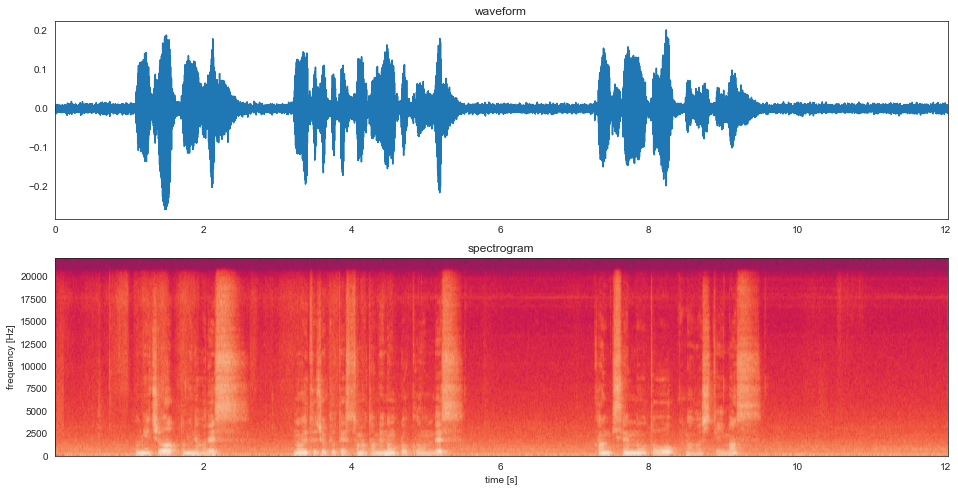

In [5]:
fig, axs = plt.subplots(2, 1, figsize=(16, 8))
axs = axs.ravel()
xs = np.arange(0, len(data)) / sr
axs[0].plot(xs, data)
axs[0].set_title('waveform')
axs[0].set_xlim(0, len(data)/sr)
axs[1].specgram(data, Fs=sr)
axs[1].set_title('spectrogram')
axs[1].set_xlabel('time [s]')
axs[1].set_ylabel('frequency [Hz]')
fig.show()

ipd.Audio(data, rate=sr)

In [6]:
def compare_plot(origin, denoise, sr=44100):
    xs = np.arange(0, len(origin)) / sr
    fig, axs = plt.subplots(4, 1, figsize=(16, 12))
    axs[0].plot(xs, origin)
    axs[0].set_title('original')
    axs[0].set_xlim(0, len(origin)/sr)
    axs[1].specgram(origin, Fs=sr)
    axs[1].set_title('spectrogram')
    axs[1].set_ylim(0, sr/2)
    axs[1].set_xlabel('time [s]')
    axs[1].set_ylabel('frequency [Hz]')
    axs[2].plot(xs, denoise)
    axs[2].set_title('denoise')
    axs[2].set_xlim(0, len(denoise)/sr)
    axs[3].specgram(denoise, Fs=sr)
    axs[3].set_title('denoise spectrogram')
    axs[3].set_ylim(0, sr/2)
    axs[3].set_xlabel('time [s]')
    axs[3].set_ylabel('frequency [Hz]')
    plt.tight_layout()
    fig.show()

    ipd.display('Before')
    ipd.display(ipd.Audio(origin, rate=sr))
    ipd.display('After')
    ipd.display(ipd.Audio(denoise, rate=sr))

---
### ウィーナーフィルター

'Before'

'After'

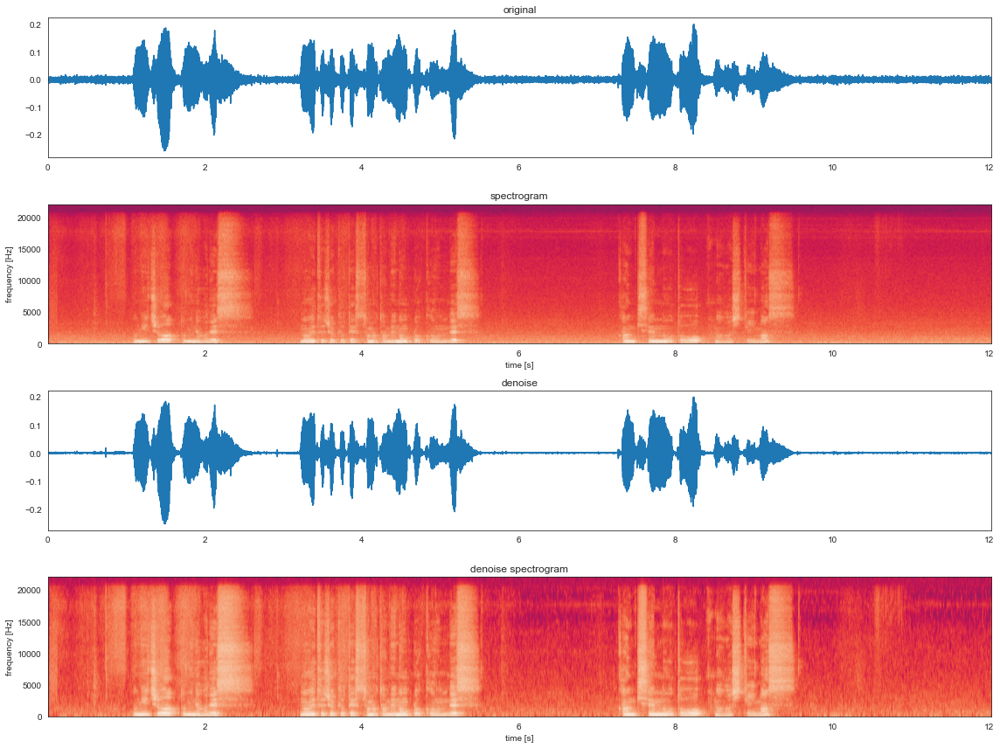

In [12]:
# parameter
mu = 10
alpha = 1.0

f, t, stft_data = scipy.signal.stft(data, fs=sr)
amp = np.abs(stft_data)


# 10s~ の区間をノイズのみとしたとき
only_noise_start_i = np.where(t>10)[0][0]
noise_energy = np.mean((amp**2)[:, only_noise_start_i:], axis=1, keepdims=True)

eps = 0.01*(amp**2)
processed_energy = np.maximum(amp**2 - alpha*noise_energy, eps)
ratio = processed_energy / (processed_energy + mu*noise_energy)
processed_stft_data = ratio * stft_data

t, denoise_data = scipy.signal.istft(processed_stft_data, fs=sr)
compare_plot(data, denoise_data)

パラメータを調整する

'Before'

'After'

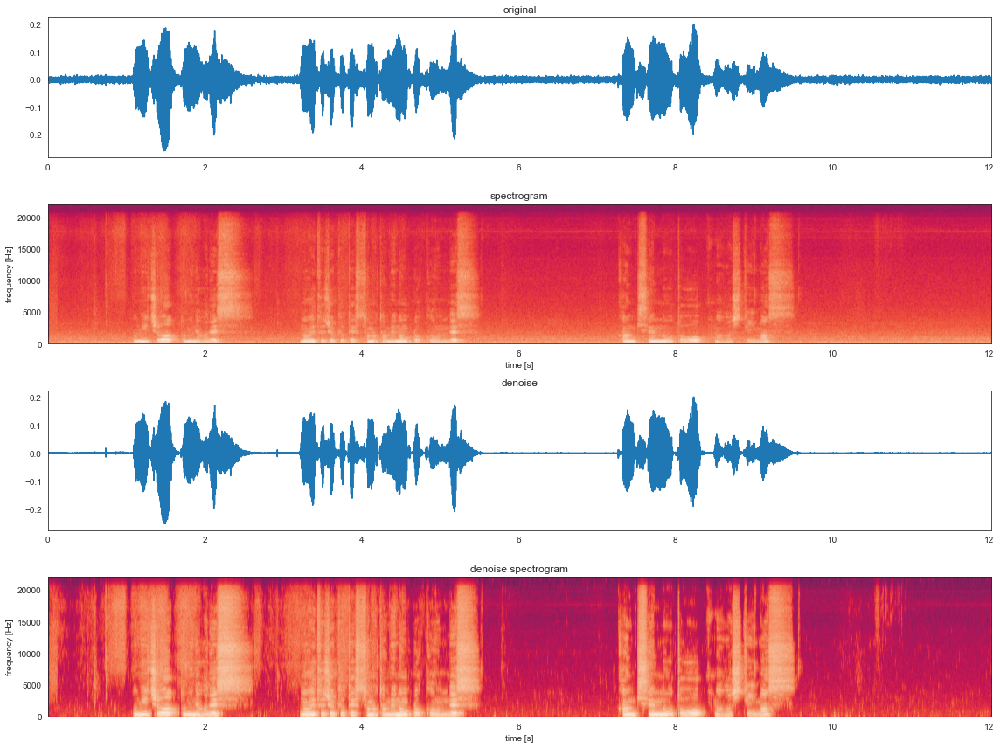

In [15]:
# parameter
mu = 10
alpha = 5.0

f, t, stft_data = scipy.signal.stft(data, fs=sr)
amp = np.abs(stft_data)


# 10s~ の区間をノイズのみとしたとき
only_noise_start_i = np.where(t>10)[0][0]
noise_energy = np.mean((amp**2)[:, only_noise_start_i:], axis=1, keepdims=True)

eps = 0.01*(amp**2)
processed_energy = np.maximum(amp**2 - alpha*noise_energy, eps)
ratio = processed_energy / (processed_energy + mu*noise_energy)
processed_stft_data = ratio * stft_data

t, denoise_data = scipy.signal.istft(processed_stft_data, fs=sr)
compare_plot(data, denoise_data)

'Before'

'After'

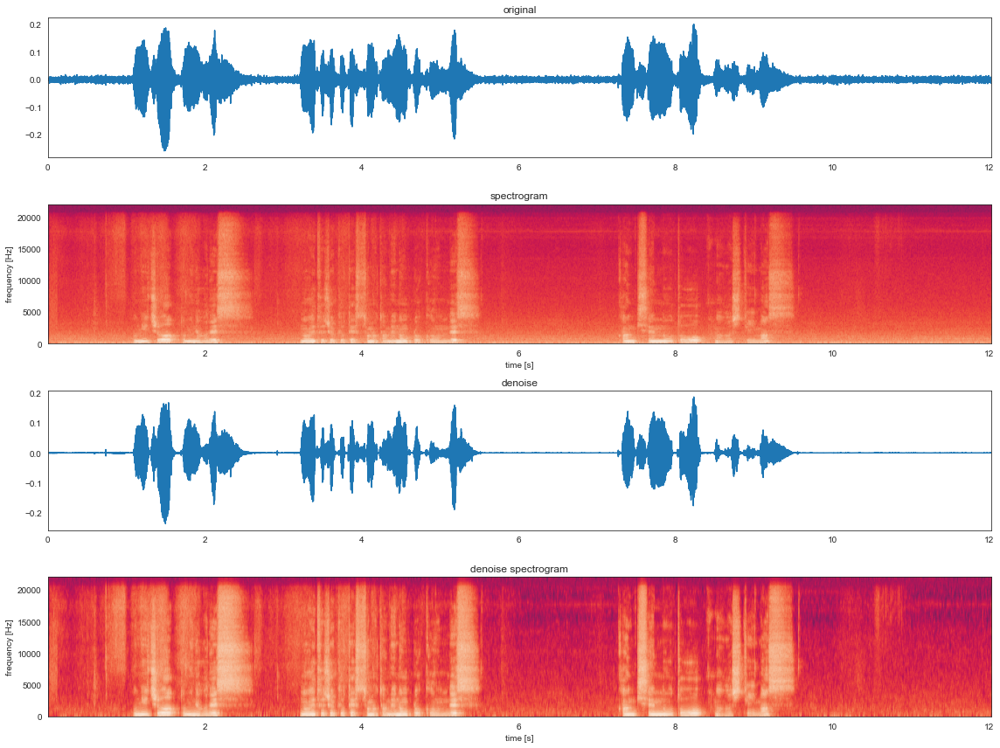

In [17]:
# parameter
mu = 100
alpha = 1.0

f, t, stft_data = scipy.signal.stft(data, fs=sr)
amp = np.abs(stft_data)


# 10s~ の区間をノイズのみとしたとき
only_noise_start_i = np.where(t>10)[0][0]
noise_energy = np.mean((amp**2)[:, only_noise_start_i:], axis=1, keepdims=True)

eps = 0.01*(amp**2)
processed_energy = np.maximum(amp**2 - alpha*noise_energy, eps)
ratio = processed_energy / (processed_energy + mu*noise_energy)
processed_stft_data = ratio * stft_data

t, denoise_data = scipy.signal.istft(processed_stft_data, fs=sr)
compare_plot(data, denoise_data)

'Before'

'After'

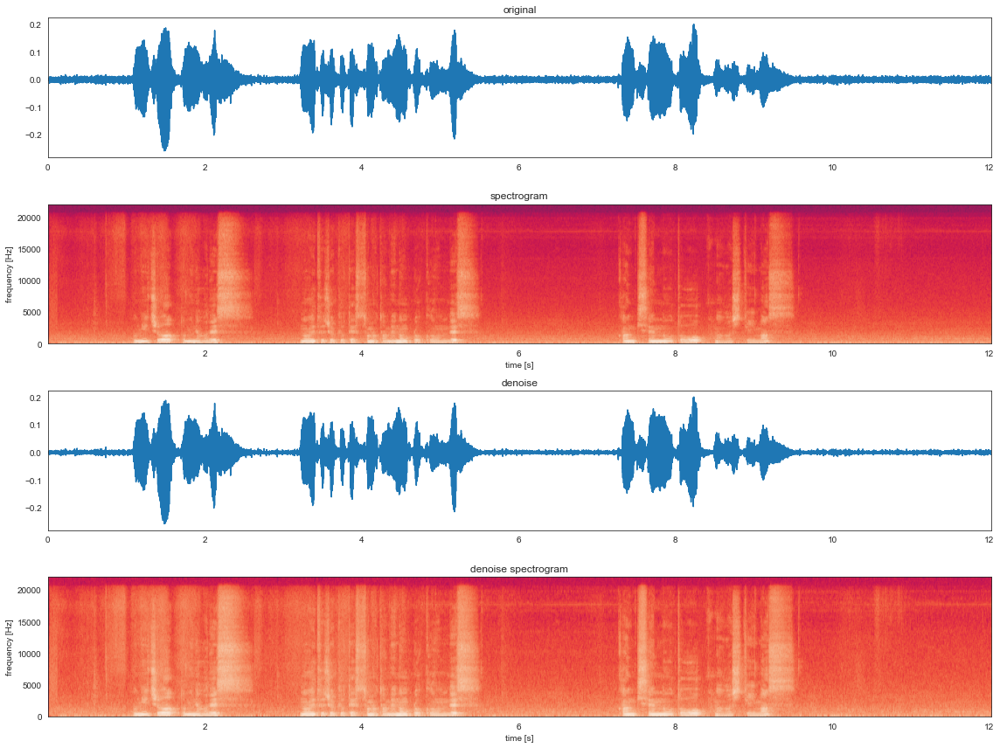

In [21]:
# parameter
mu = 1
alpha = 0.1

f, t, stft_data = scipy.signal.stft(data, fs=sr)
amp = np.abs(stft_data)


# 10s~ の区間をノイズのみとしたとき
only_noise_start_i = np.where(t>10)[0][0]
noise_energy = np.mean((amp**2)[:, only_noise_start_i:], axis=1, keepdims=True)

eps = 0.01*(amp**2)
processed_energy = np.maximum(amp**2 - alpha*noise_energy, eps)
ratio = processed_energy / (processed_energy + mu*noise_energy)
processed_stft_data = ratio * stft_data

t, denoise_data = scipy.signal.istft(processed_stft_data, fs=sr)
compare_plot(data, denoise_data)

epsを0に設定してみる

'Before'

'After'

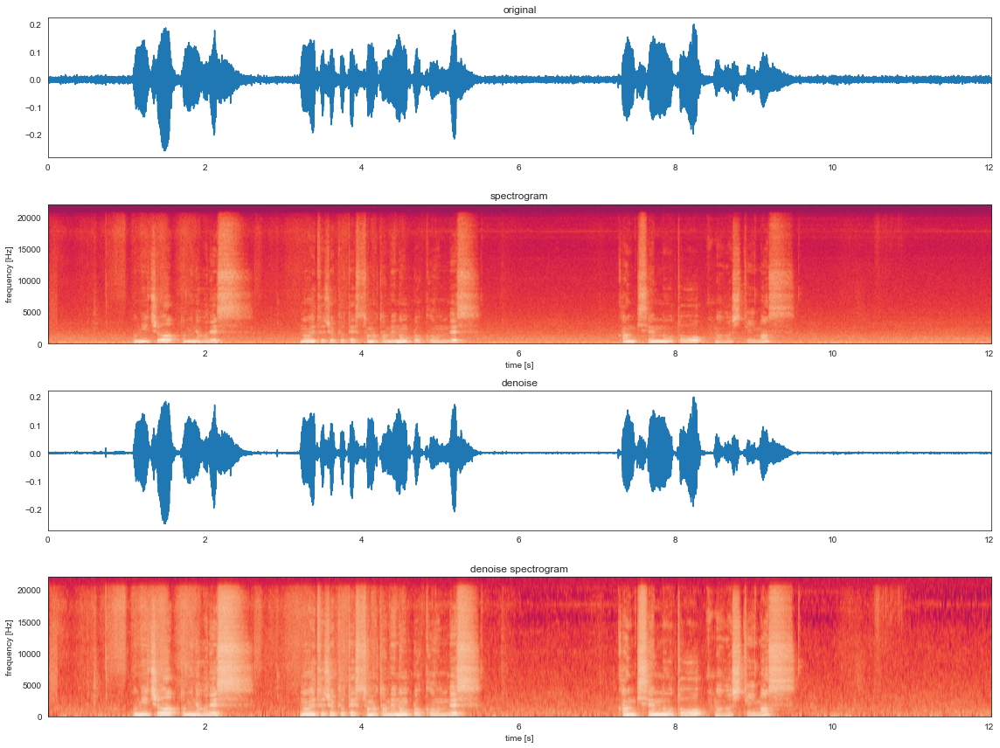

In [23]:
# parameter
mu = 10
alpha = 1.0

f, t, stft_data = scipy.signal.stft(data, fs=sr)
amp = np.abs(stft_data)


# 10s~ の区間をノイズのみとしたとき
only_noise_start_i = np.where(t>10)[0][0]
noise_energy = np.mean((amp**2)[:, only_noise_start_i:], axis=1, keepdims=True)

eps = 0.0
processed_energy = np.maximum(amp**2 - alpha*noise_energy, eps)
ratio = processed_energy / (processed_energy + mu*noise_energy)
processed_stft_data = ratio * stft_data

t, denoise_data = scipy.signal.istft(processed_stft_data, fs=sr)
compare_plot(data, denoise_data)